In [1]:
from fish_helpers import *
import seaborn as sns
from scipy.ndimage.filters import gaussian_filter

In [2]:
timepoints = ['2Hr','12Hr','15Hr']

In [3]:
md_path_2Hr = '/hybedata/Images/Zach/ExVivo/2Hr_2019Jun02/'
md_path_12Hr = '/hybedata/Images/Zach/ExVivo/Predigest_WholeMount_Third_2019Mar22/'
md_path_15Hr = '/hybedata/Images/Zach/ExVivo/15Hr_2019May10/'
md_path_dict = {}
md_path_dict['2Hr'] = md_path_2Hr
md_path_dict['12Hr'] = md_path_12Hr
md_path_dict['15Hr'] = md_path_15Hr

In [4]:
spotcalls_dict = {}
for tp in timepoints:
    spotcalls_dict[tp+'_Wounded'] = pickle.load(open(os.path.join(md_path_dict[tp],'results','wounded_spotcalls.pkl'),'rb'))
    spotcalls_dict[tp+'_Unwounded'] = pickle.load(open(os.path.join(md_path_dict[tp],'results','unwounded_spotcalls.pkl'),'rb'))

In [14]:
for tp,spotcalls in spotcalls_dict.items():
    print(tp,':',len(spotcalls)/50000)

2Hr_Wounded : 251.65146
2Hr_Unwounded : 251.98188
12Hr_Wounded : 103.95916
12Hr_Unwounded : 22.42668
15Hr_Wounded : 92.08924
15Hr_Unwounded : 51.24824


In [6]:
spotcalls_3t3 = pickle.load(open('/hybedata/Images/Zach/TNF_3T3/No_Low_High_2019May08/results/spotcalls_goodcells.pkl','rb'))

In [7]:
print(len(spotcalls_3t3))
print(len(spotcalls_3t3.cell.unique()))
print(len(spotcalls_3t3)/len(spotcalls_3t3.cell.unique()))     

2742946
4469
613.7717610203625


In [10]:
no_spotcalls_3t3 = spotcalls_3t3[spotcalls_3t3.CoordX<-2000]
low_spotcalls_3t3 = spotcalls_3t3[(spotcalls_3t3.CoordX>-2000)&(spotcalls_3t3.CoordX<4000)]
high_spotcalls_3t3 = spotcalls_3t3[spotcalls_3t3.CoordX>4000]

In [13]:
print(len(no_spotcalls_3t3))
print(len(no_spotcalls_3t3.cell.unique()))
print(len(no_spotcalls_3t3)/len(no_spotcalls_3t3.cell.unique()))     

636838
1064
598.531954887218


In [9]:
spotcalls_3t3

,gene,ssum,centroid,ave,npixels,cword_idx,z,posname,CoordX,CoordY,master_index,cell
4,Serpine1,15675.0,"(6.5, 147.5)",979.687500,4,139,4,Pos132,-4685.154500,-1638.291500,4,Pos132_2
7,Timp2,7741.0,"(7.666666666666667, 125.33333333333333)",645.083333,3,158,4,Pos132,-4687.570667,-1638.164333,7,Pos132_2
8,Drosha,17655.0,"(7.5, 185.5)",1103.437500,4,44,4,Pos132,-4681.012500,-1638.182500,8,Pos132_2
9,Lrp5,19505.0,"(10.833333333333334, 169.83333333333334)",812.708333,6,84,4,Pos132,-4682.720167,-1637.819167,11,Pos132_2
10,Serpine1,4481.0,"(12.0, 175.0)",1120.250000,1,139,4,Pos132,-4682.157000,-1637.692000,13,Pos132_2
12,Myh9,2329.0,"(13.0, 116.0)",582.250000,1,90,4,Pos132,-4688.588000,-1637.583000,15,Pos132_2
14,Gja1,9082.0,"(14.0, 119.0)",756.833333,3,59,4,Pos132,-4688.261000,-1637.474000,17,Pos132_2
15,Lrp6,2319.0,"(16.0, 157.0)",579.750000,1,85,4,Pos132,-4684.119000,-1637.256000,18,Pos132_2
18,Serpine1,3352.0,"(21.0, 105.0)",838.000000,1,139,4,Pos132,-4689.787000,-1636.711000,21,Pos132_2
20,Myh9,9795.0,"(22.5, 64.5)",612.187500,4,90,4,Pos132,-4694.201500,-1636.547500,23,Pos132_2


In [6]:
intensity_hist_dict = {}
for tp in timepoints:
    intensity_hist_dict[tp+'_Wounded'] = pickle.load(open(os.path.join(md_path_dict[tp],'results','wounded_intensity_hist.pkl'),'rb'))
    intensity_hist_dict[tp+'_Unwounded'] = pickle.load(open(os.path.join(md_path_dict[tp],'results','unwounded_intensity_hist.pkl'),'rb'))

In [7]:
intensity_bins_dict = {}
for tp in timepoints:
    intensity_bins_dict[tp+'_Wounded'] = pickle.load(open(os.path.join(md_path_dict[tp],'results','wounded_intensity_bins.pkl'),'rb'))
    intensity_bins_dict[tp+'_Unwounded'] = pickle.load(open(os.path.join(md_path_dict[tp],'results','unwounded_intensity_bins.pkl'),'rb'))

In [8]:
gene_df_dict = {}
for tp in timepoints:
    gene_df_dict[tp+'_Wounded'] = pickle.load(open(os.path.join(md_path_dict[tp],'results','wounded_gene_df.pkl'),'rb'))
    gene_df_dict[tp+'_Unwounded'] = pickle.load(open(os.path.join(md_path_dict[tp],'results','unwounded_gene_df.pkl'),'rb'))

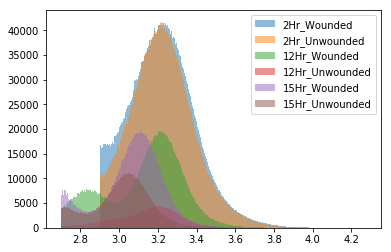

In [5]:
for tp in spotcalls_dict.keys():
    plt.hist(np.log10(spotcalls_dict[tp].ave),bins=1000,label=tp,alpha=0.5)
plt.legend()
plt.show()

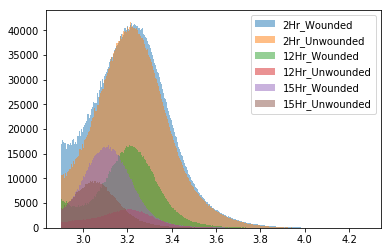

In [9]:
for tp in spotcalls_dict.keys():
    spotcalls_dict[tp] = spotcalls_dict[tp][spotcalls_dict[tp].ave>10**2.9]
    plt.hist(np.log10(spotcalls_dict[tp].ave),bins=1000,label=tp,alpha=0.5)
plt.legend()
plt.show()

2Hr_Wounded


/home/zach/PythonRepos/PySpots/fish_helpers.py:74: RuntimeWarning: divide by zero encountered in log10
  plt.scatter(np.log10(fpkms),np.log10(counts),c=color,alpha=alpha,label=label)


SpearmanrResult(correlation=0.4044183646530828, pvalue=4.115013484291397e-08)
2Hr_Unwounded
SpearmanrResult(correlation=0.4307005543955649, pvalue=4.100361944570557e-09)
12Hr_Wounded
SpearmanrResult(correlation=0.5531955744354046, pvalue=4.289716279905381e-15)
12Hr_Unwounded
SpearmanrResult(correlation=0.26929769193370073, pvalue=0.00036842703650943404)
15Hr_Wounded
SpearmanrResult(correlation=0.8049353264403597, pvalue=3.726719338749859e-40)
15Hr_Unwounded
SpearmanrResult(correlation=0.7579763361893106, pvalue=3.510951222466685e-33)


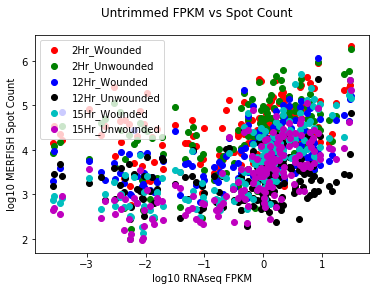

In [165]:
colors = ['r','g','b','k','c','m']
for i,tp in enumerate(spotcalls_dict.keys()):
    print(tp)
    merfish_correlation(spotcalls_dict[tp],color=colors[i],label=tp)
plt.legend()
plt.show()

In [17]:
def Display_save(image,save_path,title='Figure',cmap='inferno',figsize=(10,10),rel_min=0.1,rel_max=99.9):
    img = image.copy()
    if rel_min>0:
        img_min = np.percentile(img.ravel(),rel_min)
        img[img<img_min]=img_min
    if rel_max<100:
        img_max = np.percentile(img.ravel(),99)
        img[img>img_max]=img_max
    plt.figure(figsize=figsize)
    plt.title(str(title))
    plt.imshow(img,cmap=cmap)
    plt.savefig(os.path.join(save_path,title+'.png'),dpi=1000)
    plt.show()


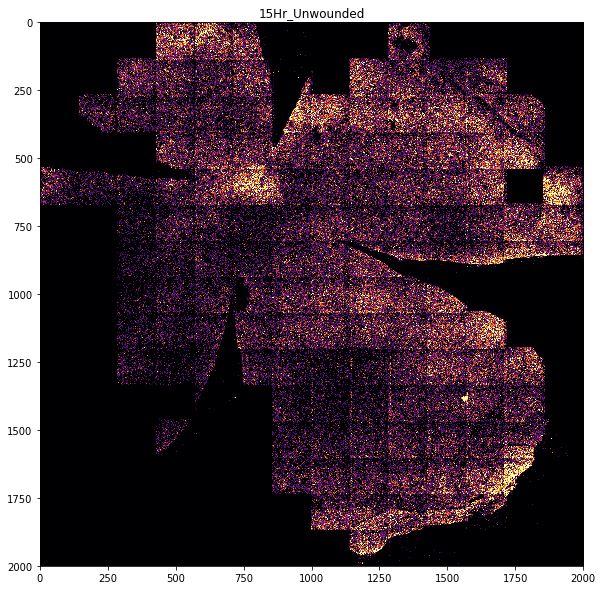

In [19]:
Display_save(hist2d[0],'/home/zach/Documents/Figures/',title=tp)
plt.show()

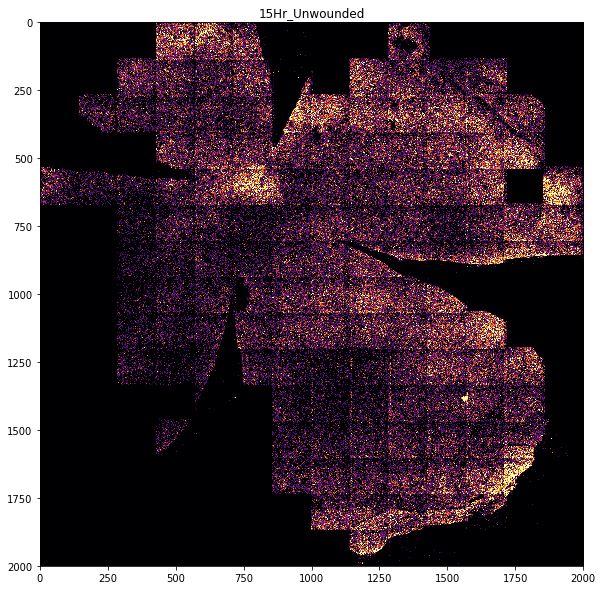

<Figure size 432x288 with 0 Axes>

In [16]:
Display(hist2d[0],title=tp)
plt.savefig(os.path.join('/home/zach/Documents/Figures/',tp+'.png'),dpi=1000)
plt.show()

In [15]:
os.path.join('/home/zach/Documents/Figures/',tp+'.png')

'/home/zach/Documents/Figures/15Hr_Unwounded.png'

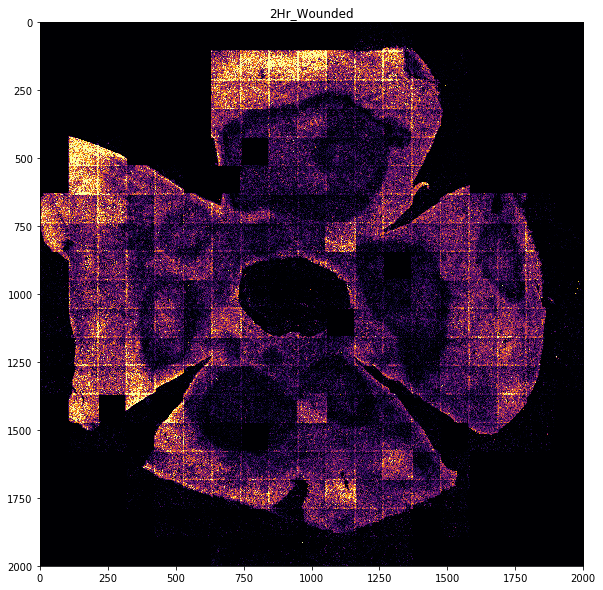

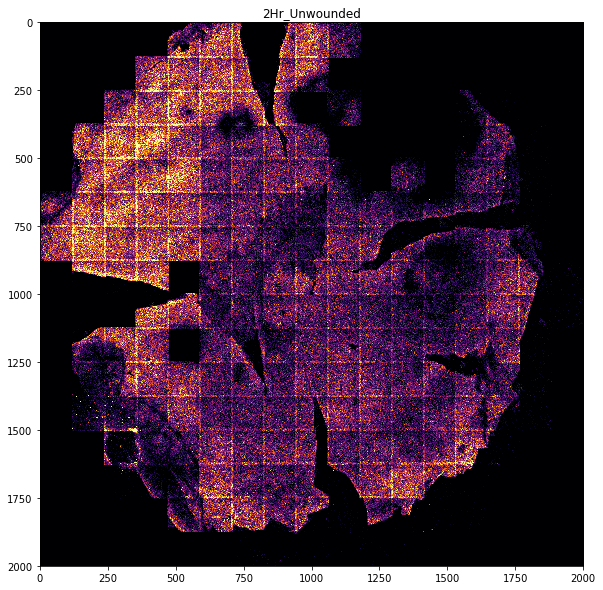

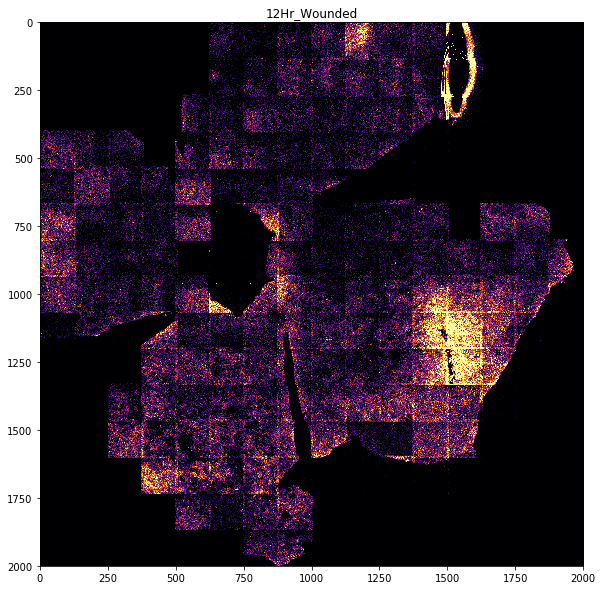

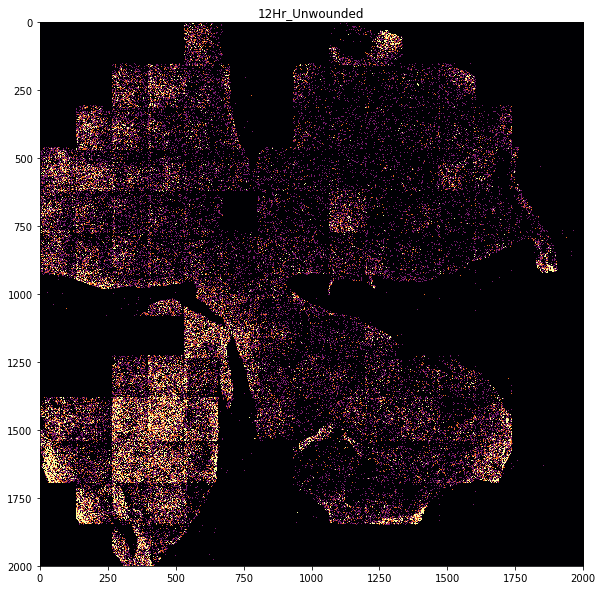

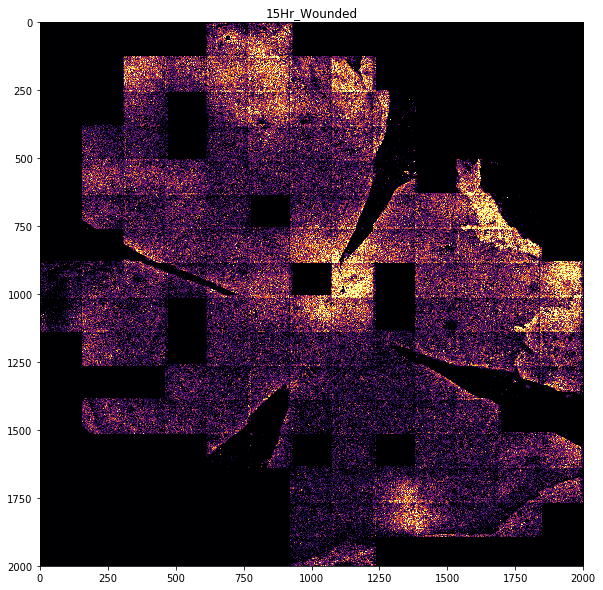

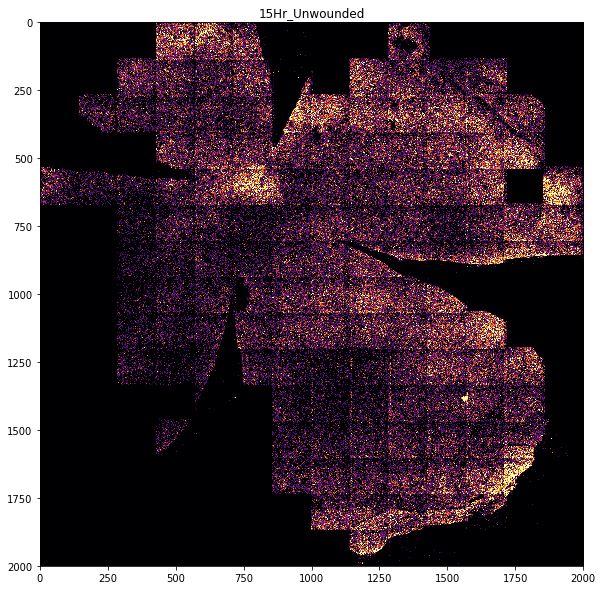

In [20]:
for tp in spotcalls_dict.keys():
    hist2d = np.histogram2d(spotcalls_dict[tp].CoordY,spotcalls_dict[tp].CoordX,bins=2000)
    Display_save(hist2d[0],'/home/zach/Documents/Figures/',title=tp)
    plt.show()

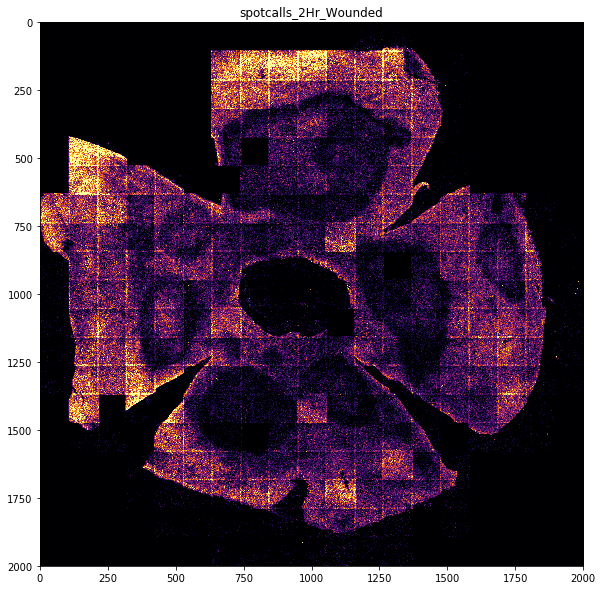

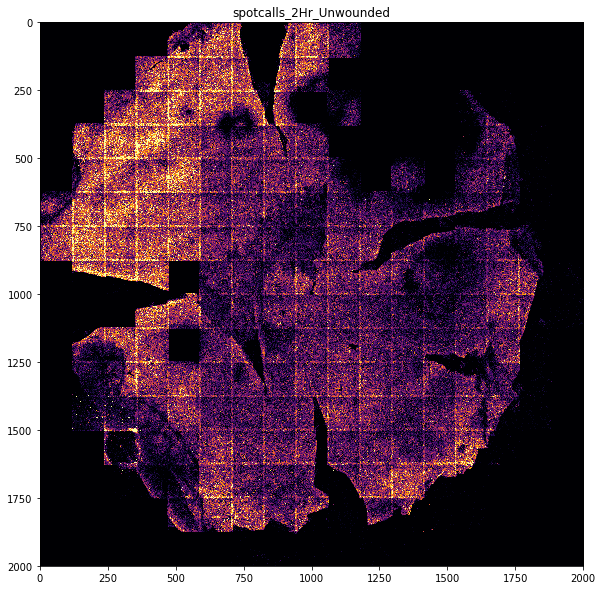

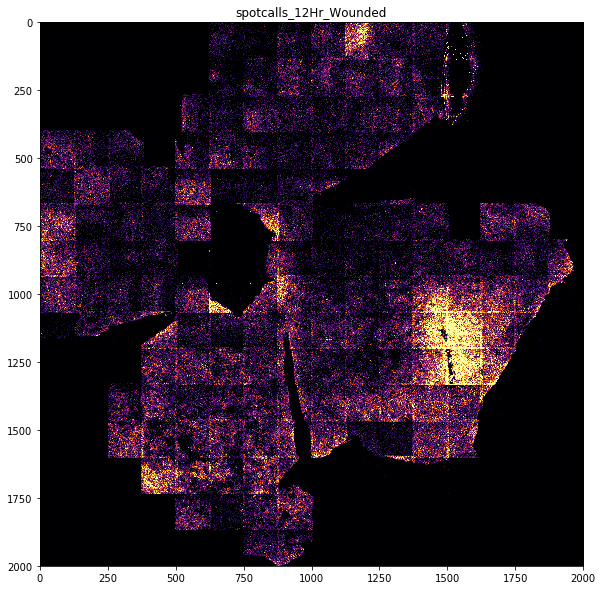

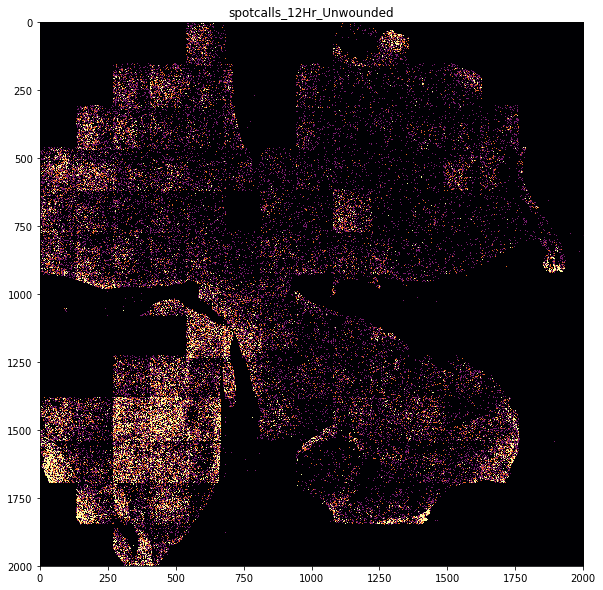

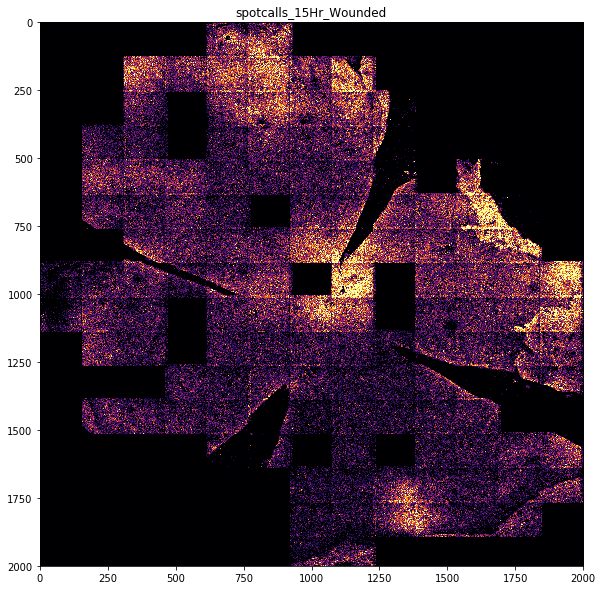

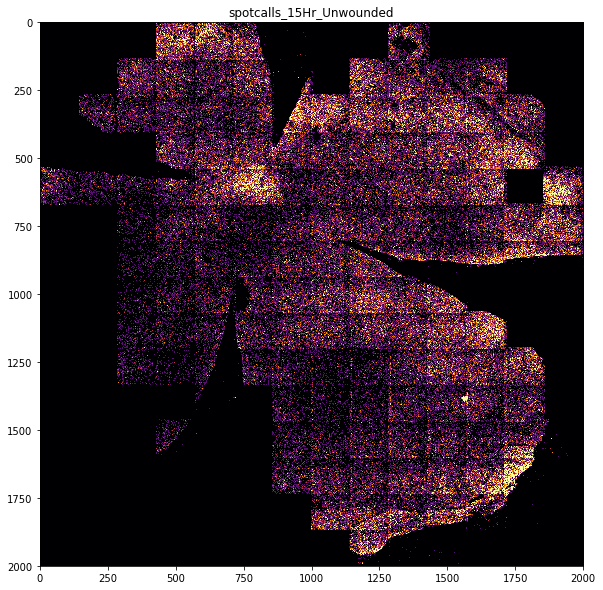

In [19]:
for tp in spotcalls_dict.keys():
    hist2d = np.histogram2d(spotcalls_dict[tp].CoordY,spotcalls_dict[tp].CoordX,bins=2000)
    Display(hist2d[0],title=tp)
    plt.show()

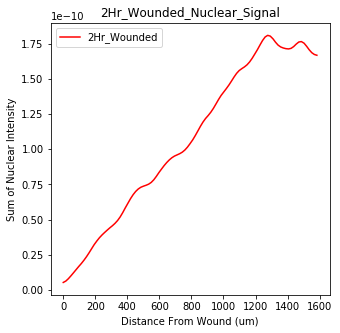

<Figure size 360x360 with 0 Axes>

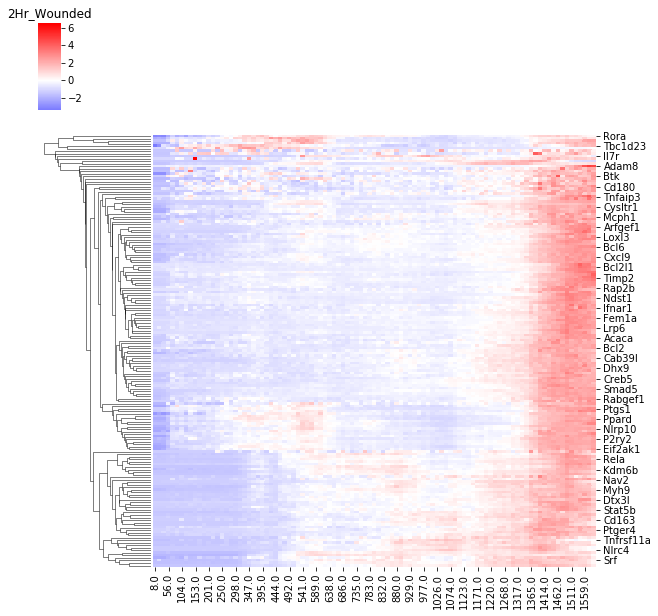

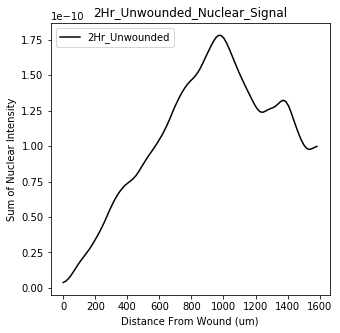

<Figure size 360x360 with 0 Axes>

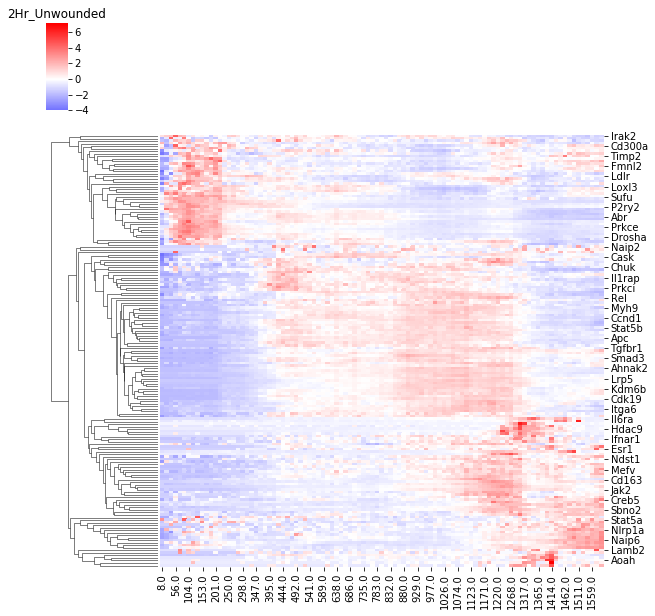

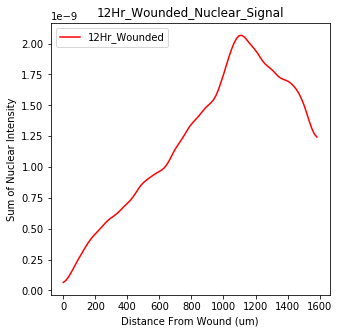

<Figure size 360x360 with 0 Axes>

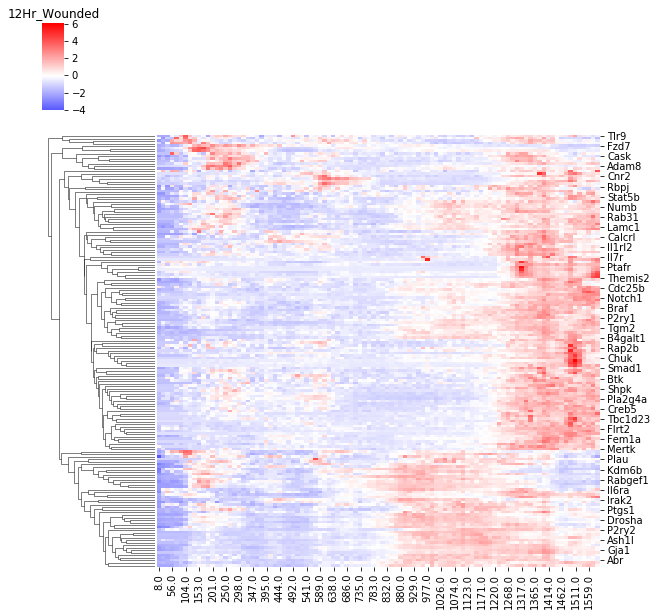

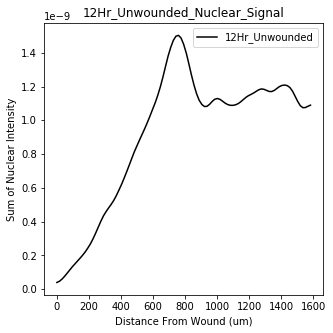

<Figure size 360x360 with 0 Axes>

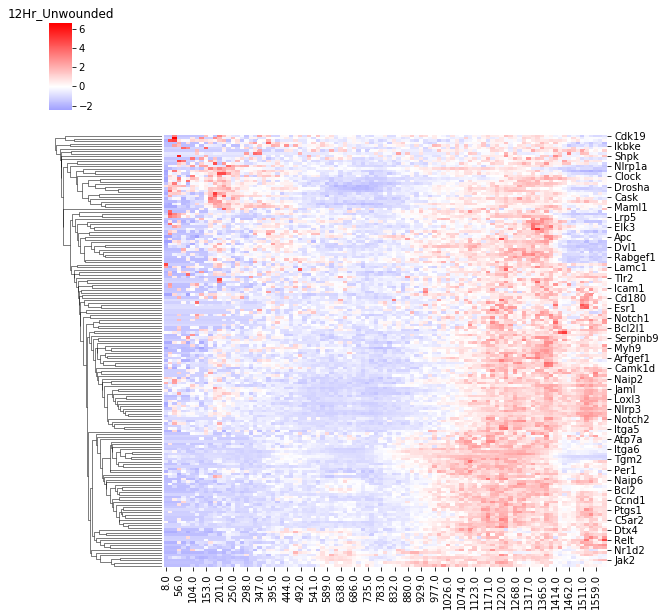

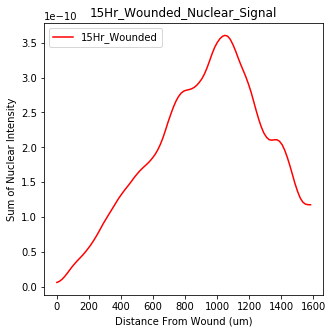

<Figure size 360x360 with 0 Axes>

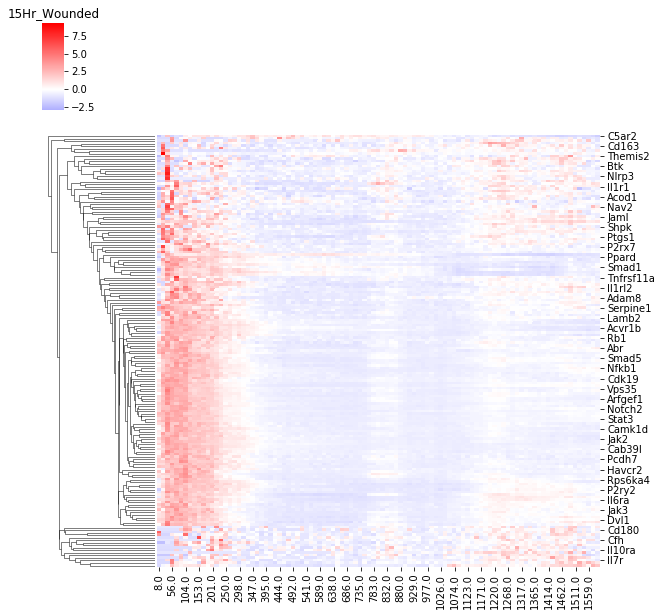

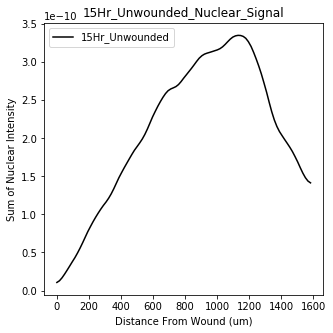

<Figure size 360x360 with 0 Axes>

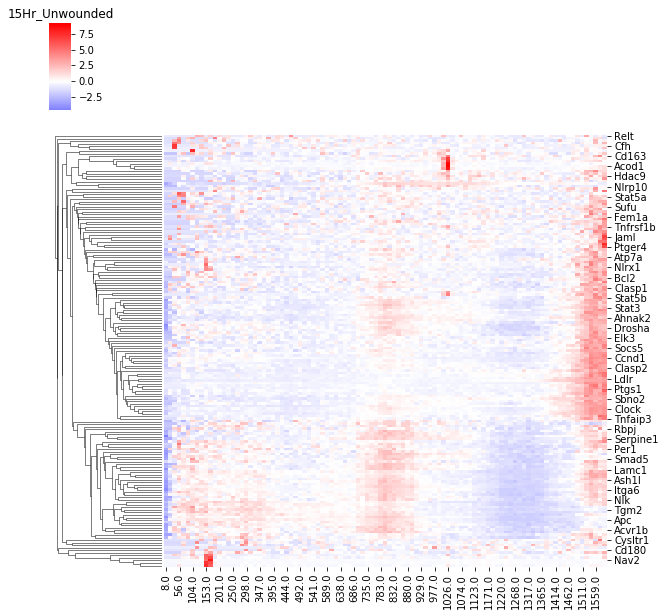

In [25]:
save_path = '/home/zach/Documents/Figures/'
for tp in timepoints:
    columns = gene_df_dict[tp+'_Wounded'].columns
    keepers = columns#[columns<1000]
    plt.figure(figsize=[5,5])
    plt.plot(intensity_bins_dict[tp+'_Wounded'][0:len(keepers)],gaussian_filter(intensity_hist_dict[tp+'_Wounded'][0:len(keepers)],2),c='r',label=str(tp+'_Wounded'))
    plt.title(str(tp+'_Wounded_Nuclear_Signal'))
    plt.ylabel('Sum of Nuclear Intensity')
    plt.xlabel('Distance From Wound (um)')
    plt.legend()
    plt.savefig(os.path.join(save_path,tp+'_Wounded_Nuclear Normalization.png'),dpi=1000)
    plt.show()
    plt.figure(figsize=[5,5])
    sns.clustermap(np.divide(gene_df_dict[tp+'_Wounded'][keepers],gaussian_filter(intensity_hist_dict[tp+'_Wounded'][0:len(keepers)],2)),z_score=0,col_cluster=False,cmap='bwr',center=0)
    plt.title(str(tp+'_Wounded'))
    #plt.savefig(os.path.join(save_path,tp+'_Wounded_Heatmap.png'),dpi=1000)
    plt.show()
    columns = gene_df_dict[tp+'_Unwounded'].columns
    keepers = columns#[columns<1000]
    plt.figure(figsize=[5,5])
    plt.plot(intensity_bins_dict[tp+'_Unwounded'][0:len(keepers)],gaussian_filter(intensity_hist_dict[tp+'_Unwounded'][0:len(keepers)],2),c='k',label=str(tp+'_Unwounded'))
    plt.title(str(tp+'_Unwounded_Nuclear_Signal'))
    plt.ylabel('Sum of Nuclear Intensity')
    plt.xlabel('Distance From Wound (um)')
    plt.legend()
    plt.savefig(os.path.join(save_path,tp+'_Unwounded_Nuclear Normalization.png'),dpi=1000)
    plt.show()
    plt.figure(figsize=[5,5])
    sns.clustermap(np.divide(gene_df_dict[tp+'_Unwounded'][keepers],gaussian_filter(intensity_hist_dict[tp+'_Unwounded'][0:len(keepers)],2)),z_score=0,col_cluster=False,cmap='bwr',center=0)
    plt.title(str(tp+'_Unwounded'))
    #plt.savefig(os.path.join(save_path,tp+'_Unwounded_Heatmap.png'),dpi=1000)
    plt.show()

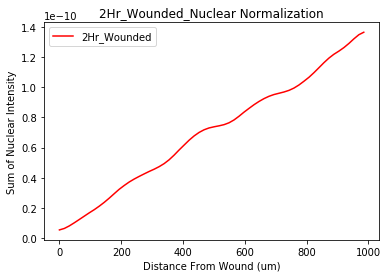

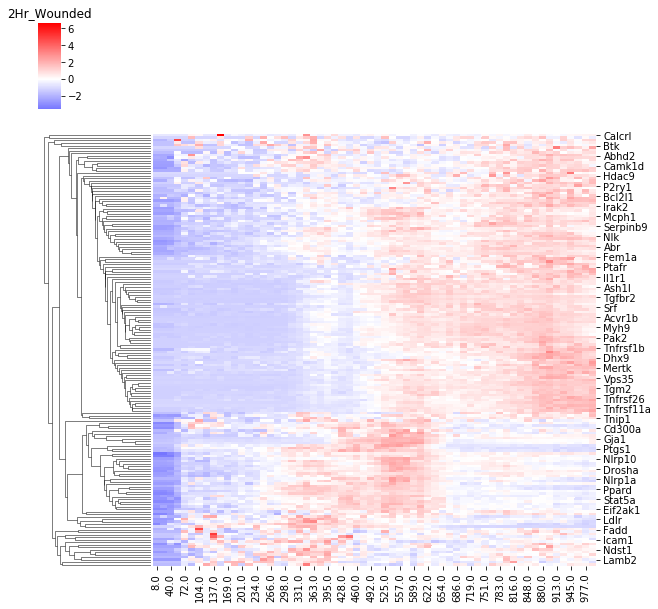

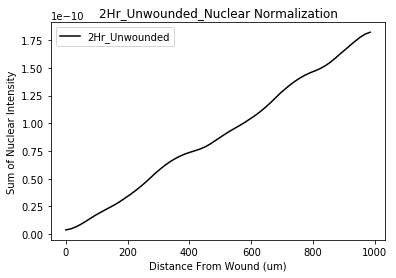

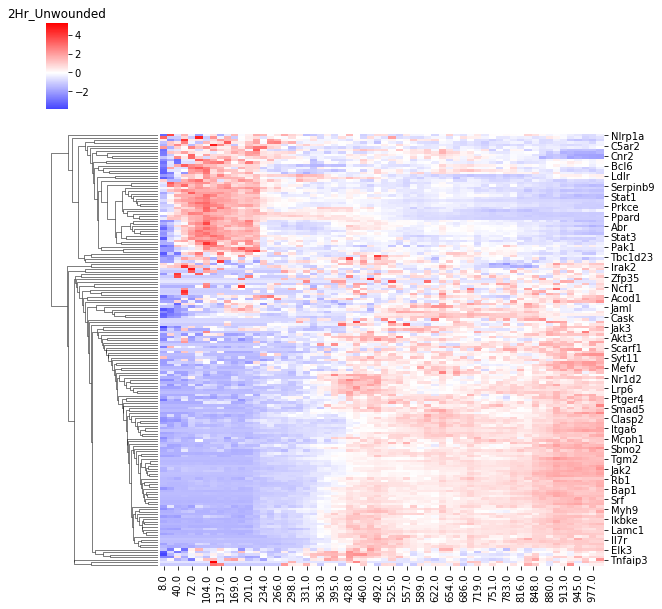

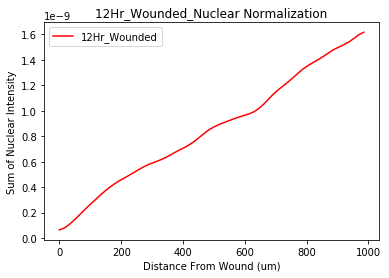

...

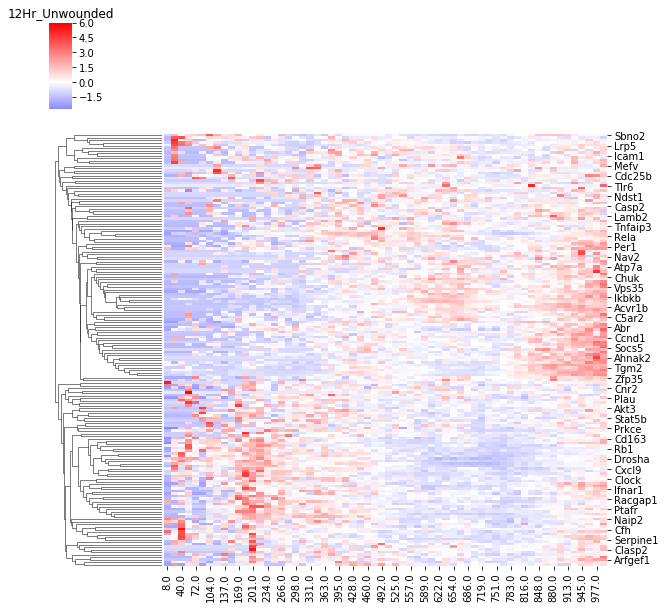

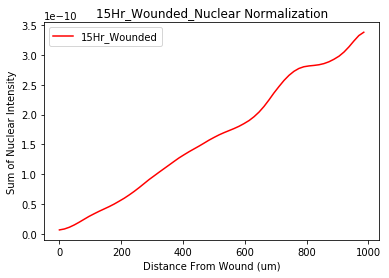

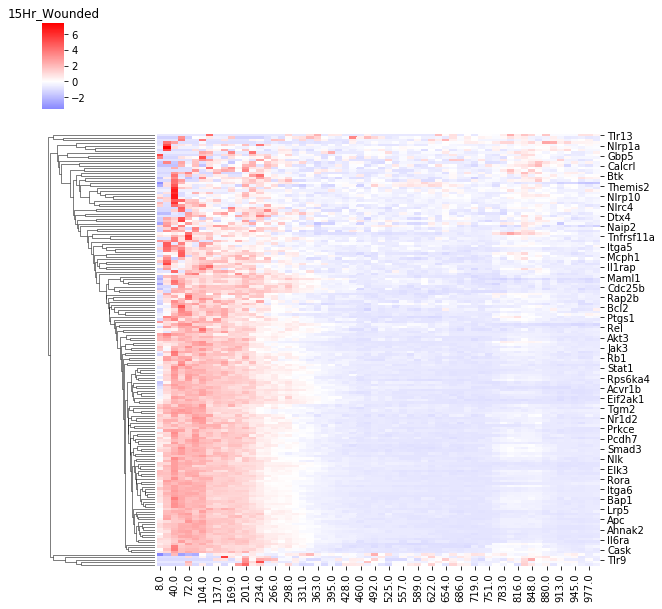

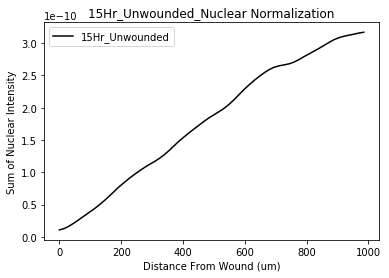

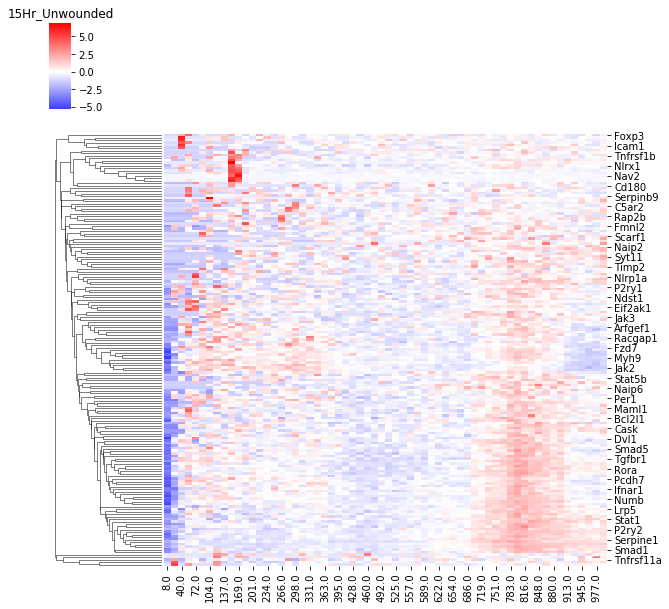

In [65]:
for tp in timepoints:
    columns = gene_df_dict[tp+'_Wounded'].columns
    keepers = columns[columns<1000]
    plt.plot(intensity_bins_dict[tp+'_Wounded'][0:len(keepers)],gaussian_filter(intensity_hist_dict[tp+'_Wounded'][0:len(keepers)],2),c='r',label=str(tp+'_Wounded'))
    plt.title(str(tp+'_Wounded_Nuclear Normalization'))
    plt.ylabel('Sum of Nuclear Intensity')
    plt.xlabel('Distance From Wound (um)')
    plt.legend()
    plt.show()
    sns.clustermap(np.divide(gene_df_dict[tp+'_Wounded'][keepers],gaussian_filter(intensity_hist_dict[tp+'_Wounded'][0:len(keepers)],2)),z_score=0,col_cluster=False,cmap='bwr',center=0)
    plt.title(str(tp+'_Wounded'))
    plt.show()
    columns = gene_df_dict[tp+'_Unwounded'].columns
    keepers = columns[columns<1000]
    plt.plot(intensity_bins_dict[tp+'_Unwounded'][0:len(keepers)],gaussian_filter(intensity_hist_dict[tp+'_Unwounded'][0:len(keepers)],2),c='k',label=str(tp+'_Unwounded'))
    plt.title(str(tp+'_Unwounded_Nuclear Normalization'))
    plt.ylabel('Sum of Nuclear Intensity')
    plt.xlabel('Distance From Wound (um)')
    plt.legend()
    plt.show()
    sns.clustermap(np.divide(gene_df_dict[tp+'_Unwounded'][keepers],gaussian_filter(intensity_hist_dict[tp+'_Unwounded'][0:len(keepers)],2)),z_score=0,col_cluster=False,cmap='bwr',center=0)
    plt.title(str(tp+'_Unwounded'))
    plt.show()

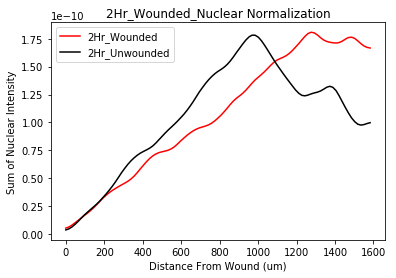

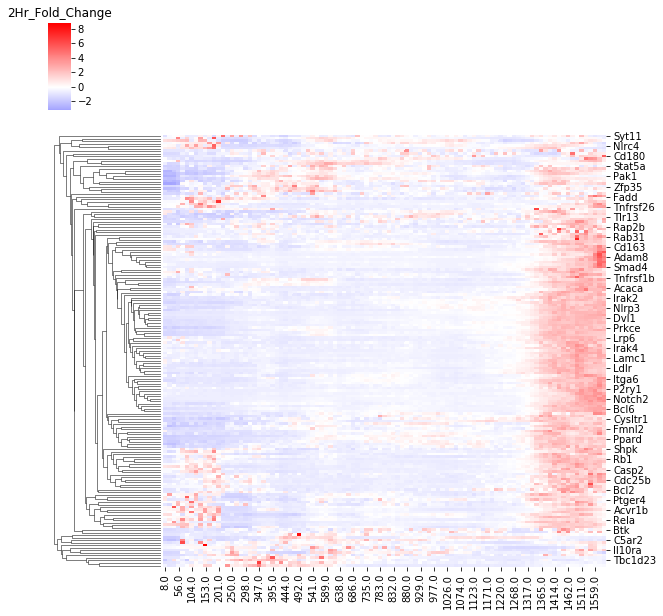

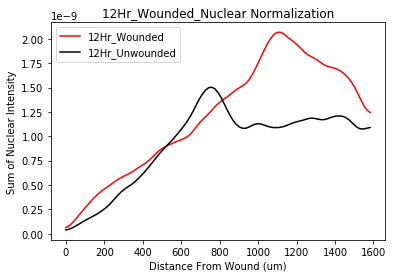

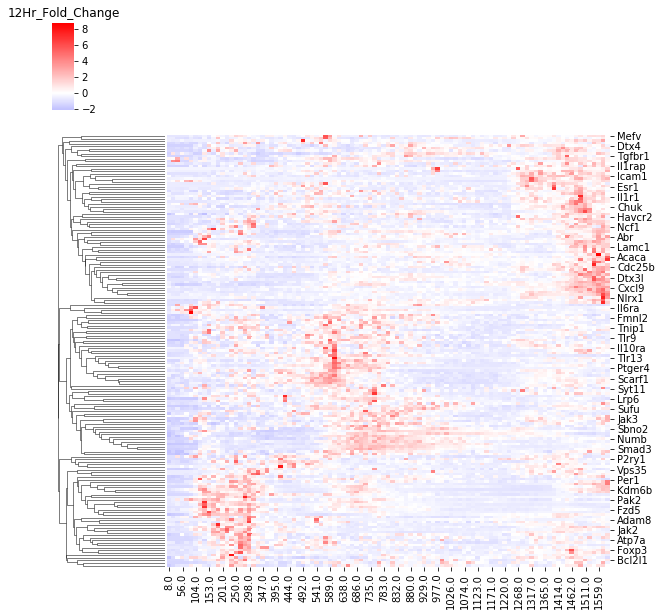

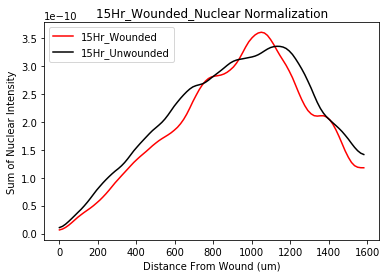

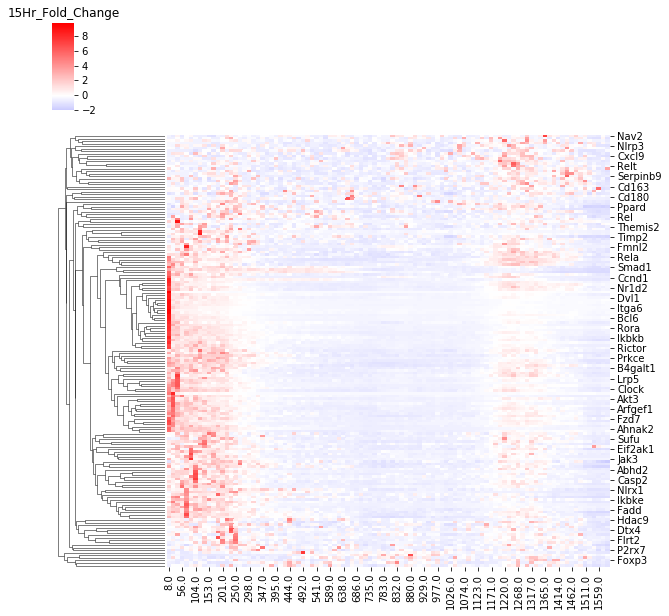

In [51]:
for tp in timepoints:
    plt.plot(intensity_bins_dict[tp+'_Wounded'][0:99],gaussian_filter(intensity_hist_dict[tp+'_Wounded'],2),c='r',label=str(tp+'_Wounded'))
    plt.plot(intensity_bins_dict[tp+'_Unwounded'][0:99],gaussian_filter(intensity_hist_dict[tp+'_Unwounded'],2),c='k',label=str(tp+'_Unwounded'))
    plt.title(str(tp+'_Wounded_Nuclear Normalization'))
    plt.ylabel('Sum of Nuclear Intensity')
    plt.xlabel('Distance From Wound (um)')
    plt.legend()
    plt.show()
    wounded_df = np.divide(gene_df_dict[tp+'_Wounded']+1,gaussian_filter(intensity_hist_dict[tp+'_Wounded'],2))
    unwounded_df = np.divide(gene_df_dict[tp+'_Unwounded']+1,gaussian_filter(intensity_hist_dict[tp+'_Unwounded'],2))
    fold_change_df = wounded_df/unwounded_df
    fold_change_df = fold_change_df.replace(to_replace=0,value=1)
    fold_change_df = fold_change_df.replace(to_replace=np.nan,value=1)
    fold_change_df = fold_change_df.replace(to_replace=np.inf,value=1)
    fold_change_df = fold_change_df.replace(to_replace=-np.inf,value=1)
    sns.clustermap(fold_change_df,z_score=0,col_cluster=False,row_cluster=True,cmap='bwr',center=0)
    plt.title(str(tp+'_Fold_Change'))
    plt.show()

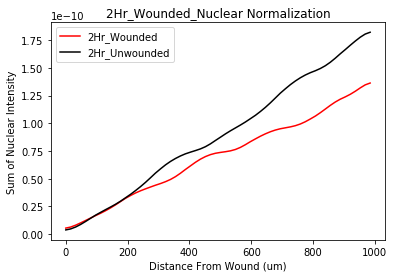

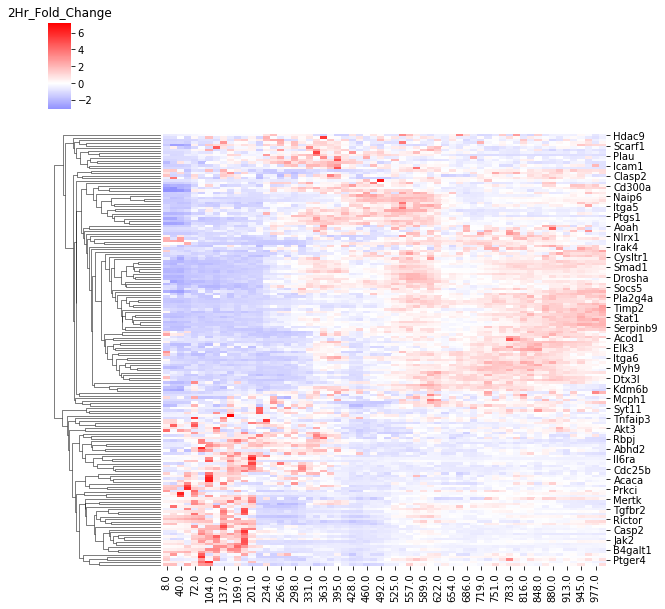

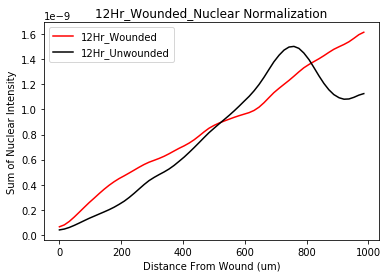

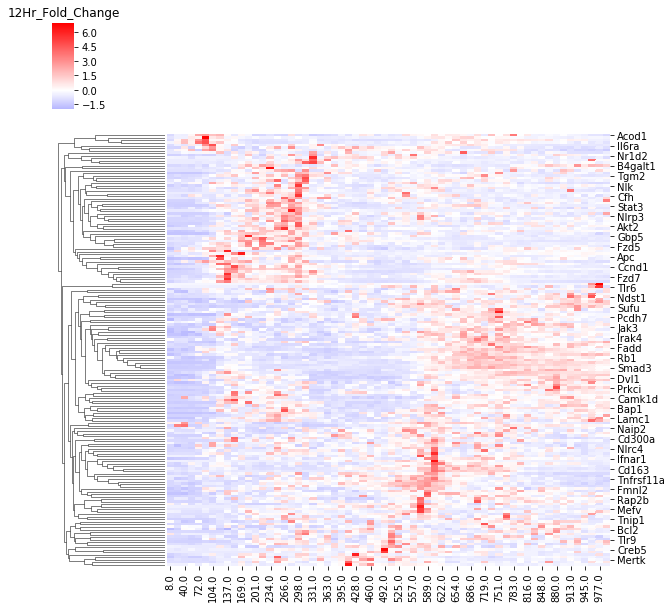

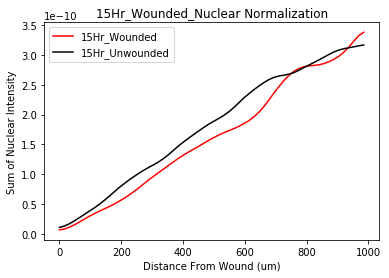

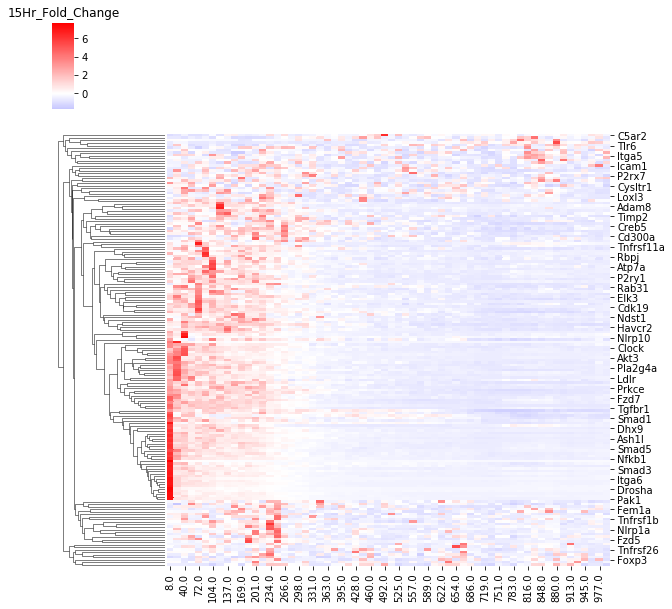

In [64]:
for tp in timepoints:
    columns = gene_df_dict[tp+'_Wounded'].columns
    keepers = columns[columns<1000]
    plt.plot(intensity_bins_dict[tp+'_Wounded'][0:len(keepers)],gaussian_filter(intensity_hist_dict[tp+'_Wounded'][0:len(keepers)],2),c='r',label=str(tp+'_Wounded'))
    plt.plot(intensity_bins_dict[tp+'_Unwounded'][0:len(keepers)],gaussian_filter(intensity_hist_dict[tp+'_Unwounded'][0:len(keepers)],2),c='k',label=str(tp+'_Unwounded'))
    plt.title(str(tp+'_Wounded_Nuclear Normalization'))
    plt.ylabel('Sum of Nuclear Intensity')
    plt.xlabel('Distance From Wound (um)')
    plt.legend()
    plt.show()
    wounded_df = np.divide(gene_df_dict[tp+'_Wounded'][keepers]+1,gaussian_filter(intensity_hist_dict[tp+'_Wounded'][0:len(keepers)],2))
    unwounded_df = np.divide(gene_df_dict[tp+'_Unwounded'][keepers]+1,gaussian_filter(intensity_hist_dict[tp+'_Unwounded'][0:len(keepers)],2))
    fold_change_df = wounded_df/unwounded_df
    fold_change_df = fold_change_df.replace(to_replace=0,value=1)
    fold_change_df = fold_change_df.replace(to_replace=np.nan,value=1)
    fold_change_df = fold_change_df.replace(to_replace=np.inf,value=1)
    fold_change_df = fold_change_df.replace(to_replace=-np.inf,value=1)
    sns.clustermap(fold_change_df,z_score=0,col_cluster=False,row_cluster=True,cmap='bwr',center=0)
    plt.title(str(tp+'_Fold_Change'))
    plt.show()

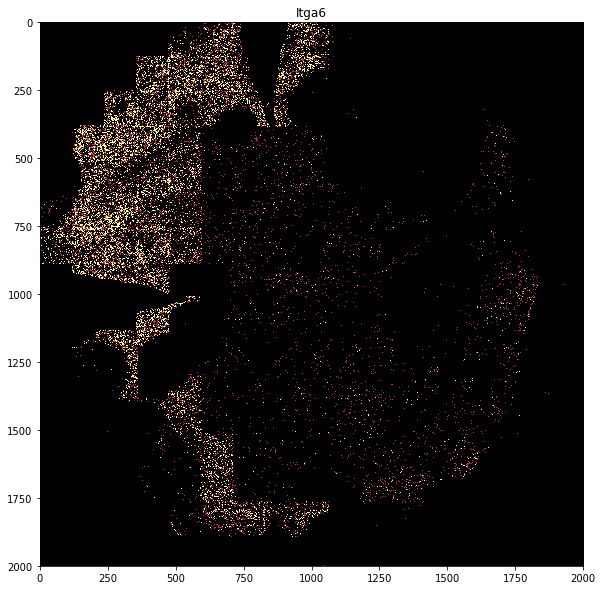

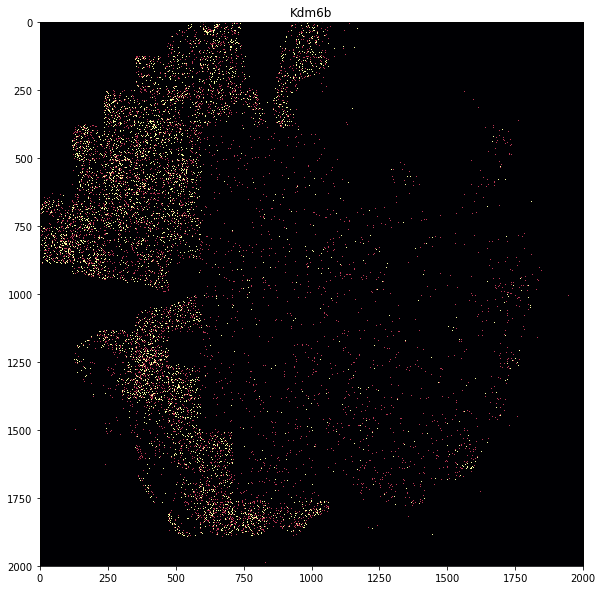

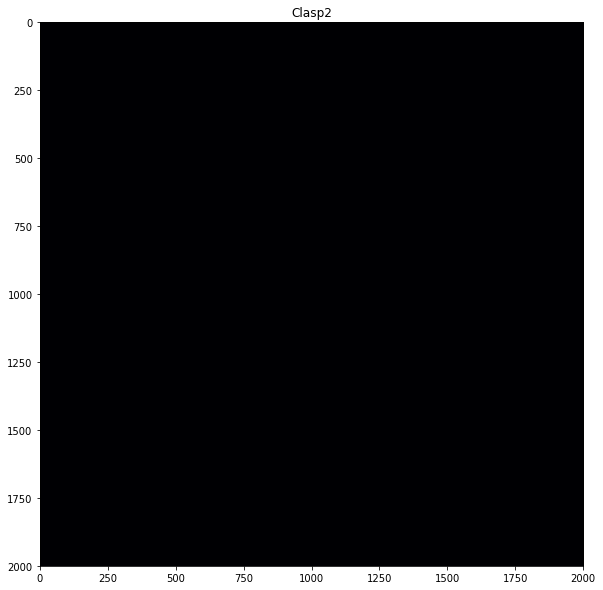

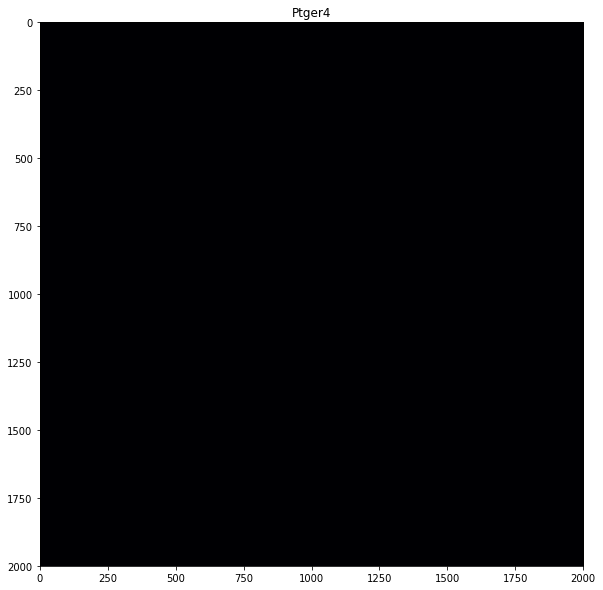

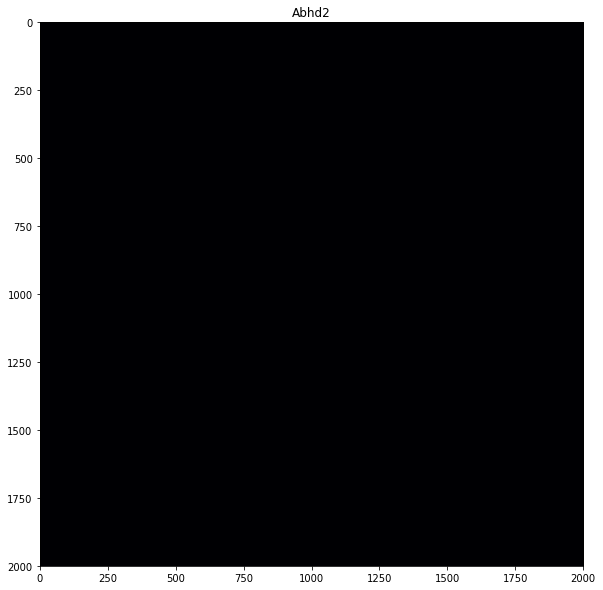

...

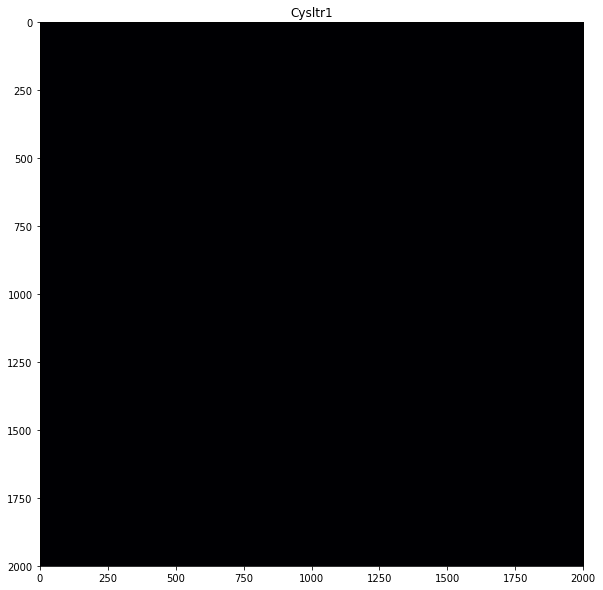

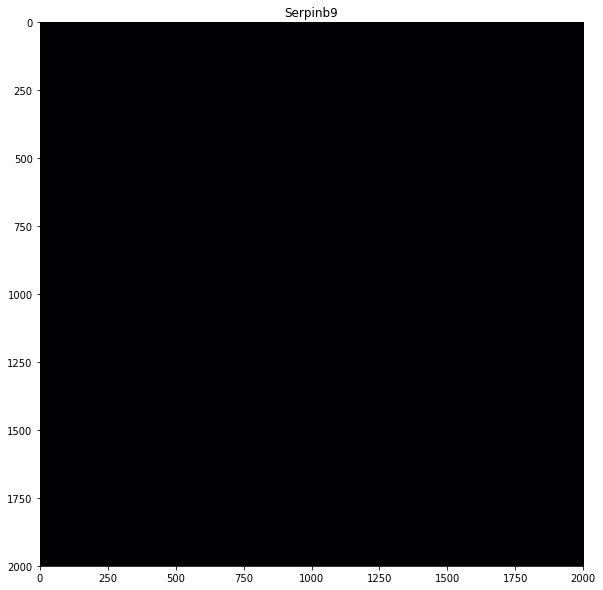

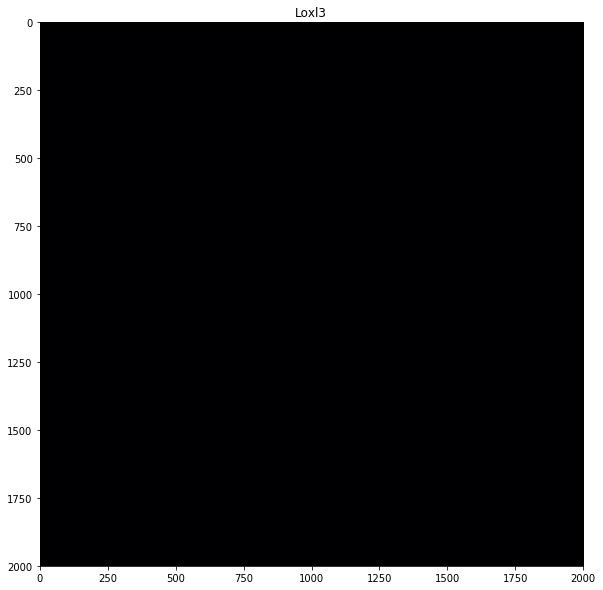

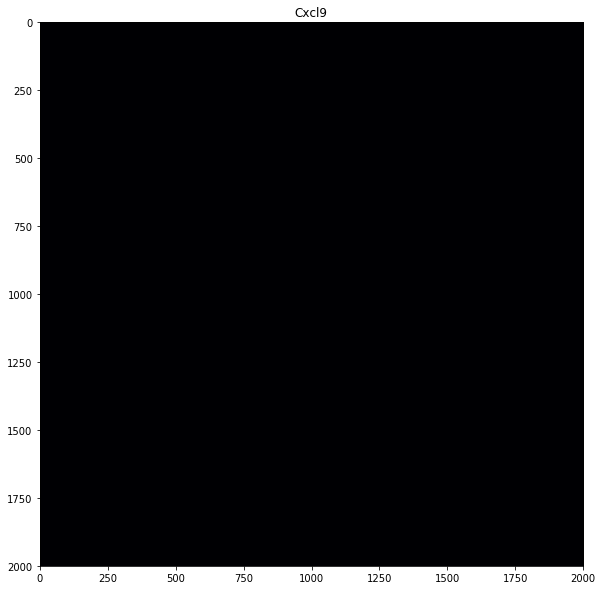

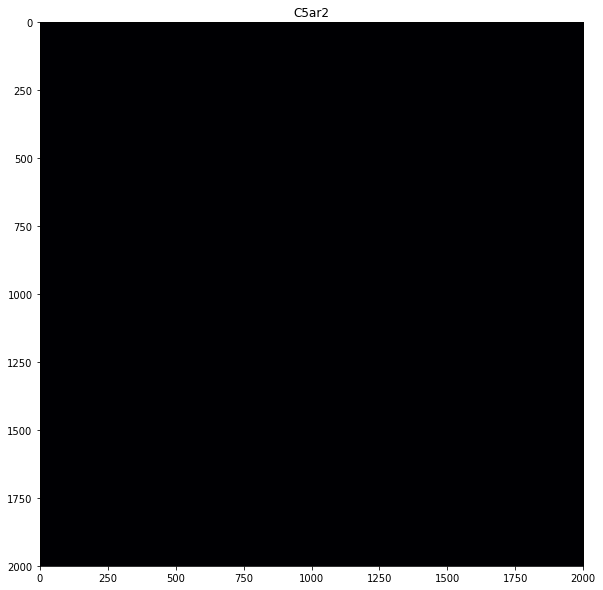

In [67]:
temp_df = spotcalls_dict['2Hr_Unwounded']
for gene in temp_df.gene.unique():
    gene_spotcalls = temp_df[temp_df.gene==gene]
    if len(gene_spotcalls)<10000:
        continue
    hist2d = np.histogram2d(gene_spotcalls.CoordY,gene_spotcalls.CoordX,bins=2000)
    Display(hist2d[0],title=gene)
    plt.show()

In [70]:
pos_array = np.zeros((len(temp_df.posname.unique()),len(temp_df.gene.unique())))
pos_df = pd.DataFrame(data = pos_array,columns=temp_df.gene.unique(),index=temp_df.posname.unique())

In [82]:
temp_df = spotcalls_dict['2Hr_Unwounded']
pos_array = np.zeros((len(temp_df.gene.unique()),len(temp_df.posname.unique())))
pos_df = pd.DataFrame(data=pos_array,columns=temp_df.posname.unique(),index=temp_df.gene.unique())
for pos in pos_df.columns:
    temp_pos_df = temp_df[temp_df.posname==pos]
    counts_list = []
    for gene in pos_df.index:
        counts_list.append(len(temp_pos_df[temp_pos_df.gene==gene]))
    pos_df[pos]=counts_list

In [83]:
pos_df

,Pos62,Pos357,Pos419,Pos155,Pos193,Pos148,Pos386,Pos362,Pos289,Pos122,...,Pos249,Pos21,Pos43,Pos226,Pos288,Pos433,Pos264,Pos327,Pos182,Pos94
Itga6,10294,97,952,348,405,4472,180,476,292,99,...,211,13549,11898,339,194,2,0,331,4362,6239
Kdm6b,3118,94,367,262,378,1310,146,301,242,271,...,191,4787,4120,351,261,4,0,195,1179,2129
Clasp2,713,17,141,87,85,375,22,88,91,35,...,37,916,956,84,63,0,0,43,259,940
Ptger4,473,3,24,24,12,167,16,13,24,8,...,34,374,176,16,32,0,0,17,172,327
Abhd2,798,7,84,79,37,305,9,87,41,46,...,24,857,597,43,15,1,0,43,259,307
Gja1,12171,4422,24641,3189,20295,8881,12830,13892,15659,1618,...,11867,8875,16261,17639,14108,66,38,17094,5226,12695
Rab31,137,4,48,43,15,31,14,23,20,38,...,23,277,71,20,10,0,0,7,32,78
Tgm2,13484,9,18,25,4,4256,0,18,18,16,...,1,5051,14033,10,4,0,0,9,5582,14687
Myh9,15318,659,5404,1461,1904,8785,1289,3700,2949,623,...,1328,13961,18111,2282,2349,19,0,1766,9454,23910
Vps35,915,3,3,1,1,730,0,3,2,9,...,3,904,1509,3,2,0,0,3,583,1420


/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/umap/umap_.py:1364: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  "n_neighbors is larger than the dataset size; truncating to "
No handles with labels found to put in legend.


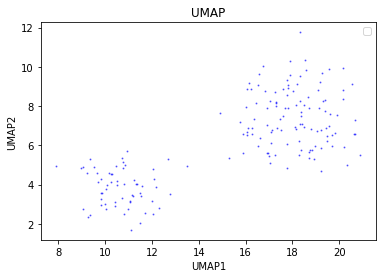

In [100]:
import umap
data_subset = np.true_divide(pos_df,np.mean(pos_df,axis=1)[:,None])
fit = umap.UMAP(n_components=2,n_neighbors=200,learning_rate=100)
umap_results = fit.fit_transform(data_subset)
plt.scatter(umap_results[:,0],umap_results[:,1],s=1,c='b',alpha=0.5)
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.title(str('UMAP'))
plt.legend()
plt.show()

In [103]:
data_subset

,Pos62,Pos357,Pos419,Pos155,Pos193,Pos148,Pos386,Pos362,Pos289,Pos122,...,Pos249,Pos21,Pos43,Pos226,Pos288,Pos433,Pos264,Pos327,Pos182,Pos94
Itga6,5.301702,0.049958,0.490307,0.179230,0.208586,2.303207,0.092705,0.245154,0.150388,0.050988,...,0.108671,6.978119,6.127808,0.174595,0.099916,0.001030,0.000000,0.170474,2.246554,3.213262
Kdm6b,3.121056,0.094092,0.367360,0.262257,0.378370,1.311284,0.146143,0.301295,0.242237,0.271266,...,0.191187,4.791692,4.124038,0.351344,0.261256,0.004004,0.000000,0.195191,1.180156,2.131087
Clasp2,3.672300,0.087558,0.726219,0.448093,0.437792,1.931434,0.113311,0.453243,0.468695,0.180267,...,0.190568,4.717850,4.923869,0.432641,0.324481,0.000000,0.000000,0.221471,1.333977,4.841461
Ptger4,4.712329,0.029888,0.239103,0.239103,0.119552,1.663761,0.159402,0.129514,0.239103,0.079701,...,0.338730,3.726027,1.753425,0.159402,0.318804,0.000000,0.000000,0.169365,1.713574,3.257783
Abhd2,5.401396,0.047381,0.568568,0.534725,0.250441,2.064443,0.060918,0.588874,0.277515,0.311359,...,0.162448,5.800747,4.040894,0.291053,0.101530,0.006769,0.000000,0.291053,1.753085,2.077981
Gja1,1.255058,0.455991,2.540949,0.328846,2.092795,0.915798,1.323014,1.432526,1.614737,0.166846,...,1.223710,0.915179,1.676814,1.818912,1.454799,0.006806,0.003919,1.762712,0.538899,1.309093
Rab31,3.843366,0.112215,1.346581,1.206312,0.420807,0.869667,0.392753,0.645237,0.561075,1.066043,...,0.645237,7.770894,1.991818,0.561075,0.280538,0.000000,0.000000,0.196376,0.897721,2.188194
Tgm2,4.347085,0.002901,0.005803,0.008060,0.001290,1.372085,0.000000,0.005803,0.005803,0.005158,...,0.000322,1.628384,4.524076,0.003224,0.001290,0.000000,0.000000,0.002901,1.799572,4.734918
Myh9,3.191673,0.137310,1.125982,0.304415,0.396719,1.830451,0.268577,0.770935,0.614456,0.129809,...,0.276703,2.908927,3.773625,0.475480,0.489440,0.003959,0.000000,0.367965,1.969844,4.981909
Vps35,3.774088,0.012374,0.012374,0.004125,0.004125,3.011021,0.000000,0.012374,0.008249,0.037122,...,0.012374,3.728716,6.224151,0.012374,0.008249,0.000000,0.000000,0.012374,2.404692,5.857054


In [111]:
A = []
B = []
for i,gene in enumerate(data_subset.index):
    if umap_results[i,0]<14:
        A.append(gene)
    else:
        B.append(gene)

In [112]:
A

['Gja1',
 'Tnfrsf21',
 'Cnr2',
 'Nfkb1',
 'Socs5',
 'Dvl1',
 'Bcl6',
 'Ppard',
 'Adam8',
 'Smad1',
 'Ikbkb',
 'Ptgs1',
 'Notch2',
 'Clock',
 'Stat1',
 'Gbp5',
 'Itga5',
 'Cask',
 'Relt',
 'Rora',
 'Stat3',
 'Abr',
 'Maml1',
 'Icam1',
 'Akt2',
 'Pcdh7',
 'Eif2ak1',
 'Drosha',
 'Per1',
 'Plau',
 'Tbc1d23',
 'Prkce',
 'Sufu',
 'Nlrp3',
 'Fmnl2',
 'P2ry2',
 'Nlrp10',
 'Scarf1',
 'Pak1',
 'Serpine1',
 'Naip6',
 'Timp2',
 'Casp9',
 'Jaml',
 'Cfh',
 'Cysltr1',
 'Serpinb9',
 'Loxl3',
 'Cxcl9',
 'C5ar2',
 'Zfp35',
 'Esr1',
 'Cd300a',
 'Flrt2',
 'Nlrp1a',
 'Ncf1',
 'Tlr13',
 'Stat5a',
 'Lamb2',
 'Tlr6']

In [113]:
B

['Itga6',
 'Kdm6b',
 'Clasp2',
 'Ptger4',
 'Abhd2',
 'Rab31',
 'Tgm2',
 'Myh9',
 'Vps35',
 'Tgfbr2',
 'Rps6ka4',
 'P2rx7',
 'Ccnd1',
 'Ldlr',
 'Apc',
 'Acvr1b',
 'Notch1',
 'Nav2',
 'Braf',
 'Pak2',
 'Numb',
 'Rela',
 'Arfgef1',
 'Tnfaip3',
 'Ahnak2',
 'Srf',
 'Elk3',
 'Tnfrsf11a',
 'Il1rap',
 'Smad3',
 'Tgfbr1',
 'Smad4',
 'Prkch',
 'Rictor',
 'Ikbke',
 'Dtx3l',
 'Fzd7',
 'Tnip1',
 'Sbno2',
 'Acod1',
 'Lrp5',
 'Ash1l',
 'Cab39l',
 'Stat5b',
 'Jak2',
 'Cdk19',
 'Il1rl2',
 'Syt11',
 'Bcl2l1',
 'Il7r',
 'Bap1',
 'Lamc1',
 'Pla2g4a',
 'Prkci',
 'Themis2',
 'Rel',
 'Ndst1',
 'Fzd5',
 'Jak3',
 'B4galt1',
 'Smad5',
 'Ifnar1',
 'Ptafr',
 'Nlrx1',
 'Dtx4',
 'Tnfrsf26',
 'Tnfrsf1b',
 'Mertk',
 'Irak2',
 'Rabgef1',
 'Racgap1',
 'Nlrc4',
 'Il1r1',
 'P2ry1',
 'Fem1a',
 'Dhx9',
 'Il10ra',
 'Akt3',
 'Mcph1',
 'Rb1',
 'Irak4',
 'Il6ra',
 'Chuk',
 'Casp2',
 'Clasp1',
 'Acaca',
 'Nfkb2',
 'Lrp6',
 'Nlk',
 'Tlr2',
 'Creb5',
 'Cd163',
 'Cdc25b',
 'Fadd',
 'Mefv',
 'Nr1d2',
 'Rap2b',
 'Rbpj',
 'Shpk',
 'C

In [118]:
genes = temp_df.gene
A_Mask = []
B_Mask = []
for gene in temp_df.gene:
    if gene in A:
        A_Mask.append(True)
        B_Mask.append(False)
    else:
        A_Mask.append(False)
        B_Mask.append(True)

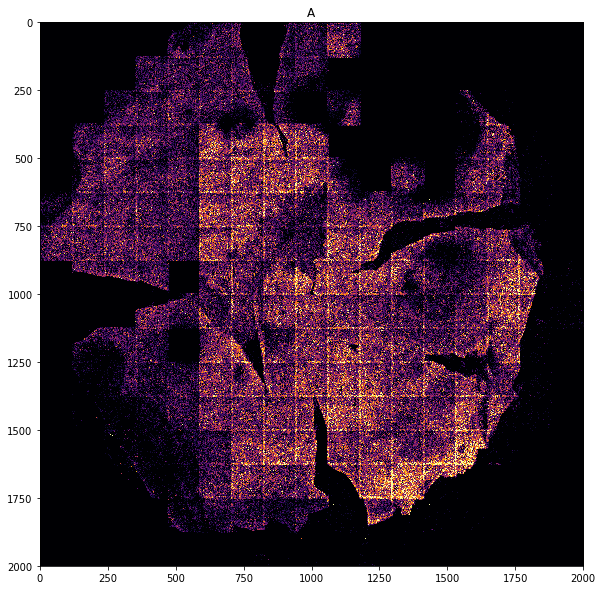

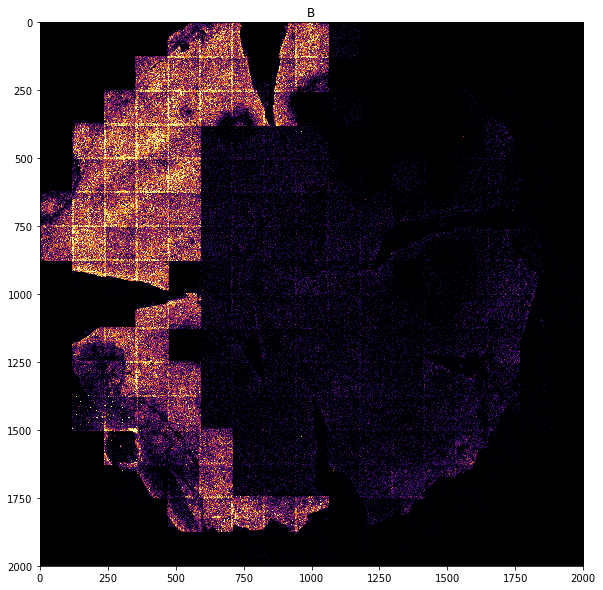

In [119]:
hist2d = np.histogram2d(temp_df[A_Mask].CoordY,temp_df[A_Mask].CoordX,bins=2000)
Display(hist2d[0],title='A')
plt.show()
hist2d = np.histogram2d(temp_df[B_Mask].CoordY,temp_df[B_Mask].CoordX,bins=2000)
Display(hist2d[0],title='B')
plt.show()

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/umap/umap_.py:1364: UserWarning: n_neighbors is larger than the dataset size; truncating to X.shape[0] - 1
  "n_neighbors is larger than the dataset size; truncating to "
No handles with labels found to put in legend.


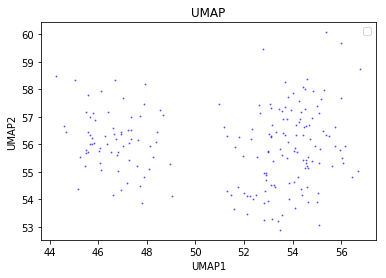

In [120]:
import umap
data_subset = np.true_divide(pos_df.T,np.mean(pos_df,axis=0)[:,None])
fit = umap.UMAP(n_components=2,n_neighbors=200,learning_rate=100)
umap_results2 = fit.fit_transform(data_subset)
plt.scatter(umap_results2[:,0],umap_results2[:,1],s=1,c='b',alpha=0.5)
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.title(str('UMAP'))
plt.legend()
plt.show()

In [170]:
np.true_divide(np.true_divide(pos_df,np.mean(pos_df,axis=1)[:,None]).T,np.mean(pos_df,axis=0)[:,None])

,Itga6,Kdm6b,Clasp2,Ptger4,Abhd2,Gja1,Rab31,Tgm2,Myh9,Vps35,...,Nlrp1a,Ncf1,Tlr13,Stat5a,Aoah,Bcl2,Lamb2,Tlr6,Havcr2,Btk
Pos62,0.006532,0.003845,0.004525,0.005806,0.006655,0.001546,0.004735,0.005356,0.003932,0.004650,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Pos357,0.000460,0.000866,0.000806,0.000275,0.000436,0.004197,0.001033,0.000027,0.001264,0.000114,...,0.007795,0.009090,0.005080,0.003463,0.004197,0.002909,0.000000,0.000000,0.000000,0.000000
Pos419,0.000969,0.000726,0.001435,0.000473,0.001124,0.005023,0.002662,0.000011,0.002226,0.000024,...,0.008778,0.008980,0.005274,0.008676,0.002704,0.000312,0.003834,0.009390,0.001438,0.000000
Pos155,0.000636,0.000930,0.001589,0.000848,0.001897,0.001166,0.004279,0.000029,0.001080,0.000015,...,0.004628,0.001051,0.006853,0.002224,0.001618,0.000561,0.001376,0.002808,0.000000,0.000000
Pos193,0.000471,0.000854,0.000988,0.000270,0.000565,0.004722,0.000950,0.000003,0.000895,0.000009,...,0.003409,0.002674,0.003114,0.004245,0.000000,0.000357,0.000000,0.000893,0.000000,0.000000
Pos148,0.005030,0.002864,0.004218,0.003633,0.004508,0.002000,0.001899,0.002996,0.003997,0.006576,...,0.000100,0.000647,0.000000,0.000000,0.000000,0.002071,0.000847,0.002594,0.000000,0.000000
Pos386,0.000387,0.000610,0.000473,0.000665,0.000254,0.005521,0.001639,0.000000,0.001121,0.000000,...,0.006018,0.007007,0.005759,0.003664,0.003807,0.000659,0.003237,0.001652,0.001518,0.000000
Pos362,0.000645,0.000793,0.001193,0.000341,0.001550,0.003771,0.001699,0.000015,0.002030,0.000033,...,0.007834,0.012741,0.009203,0.022450,0.006003,0.002912,0.006127,0.003127,0.000000,0.000000
Pos289,0.000421,0.000678,0.001312,0.000669,0.000777,0.004520,0.001571,0.000016,0.001720,0.000023,...,0.003268,0.004700,0.003605,0.007723,0.002553,0.013713,0.003257,0.004433,0.002036,0.000000
Pos122,0.000164,0.000872,0.000579,0.000256,0.001001,0.000536,0.003426,0.000017,0.000417,0.000119,...,0.001177,0.003491,0.012122,0.004836,0.000000,0.000000,0.001247,0.000000,0.001169,0.000000


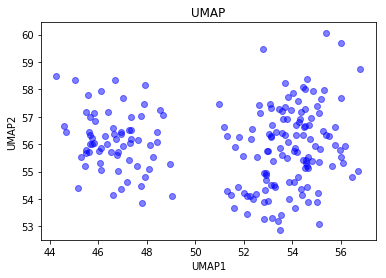

In [173]:
import umap
data_subset = np.true_divide(np.true_divide(pos_df,np.mean(pos_df,axis=1)[:,None]).T,np.mean(pos_df,axis=0)[:,None])
fit = umap.UMAP(n_components=2,n_neighbors=50,learning_rate=100)
umap_results3 = fit.fit_transform(data_subset)
plt.scatter(umap_results2[:,0],umap_results2[:,1],c='b',alpha=0.5)
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.title(str('UMAP'))
#plt.legend()
plt.show()

No handles with labels found to put in legend.


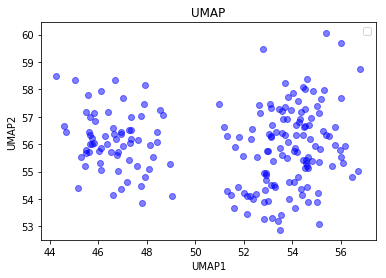

In [166]:
plt.scatter(umap_results2[:,0],umap_results2[:,1],c='b',alpha=0.5)
plt.xlabel('UMAP1')
plt.ylabel('UMAP2')
plt.title(str('UMAP'))
plt.legend()
plt.show()

In [123]:
A = []
B = []
for i,pos in enumerate(data_subset.index):
    if umap_results2[i,0]<50:
        A.append(pos)
    else:
        B.append(pos)
A_Mask = []
B_Mask = []
for pos in temp_df.posname:
    if pos in A:
        A_Mask.append(True)
        B_Mask.append(False)
    else:
        A_Mask.append(False)
        B_Mask.append(True)

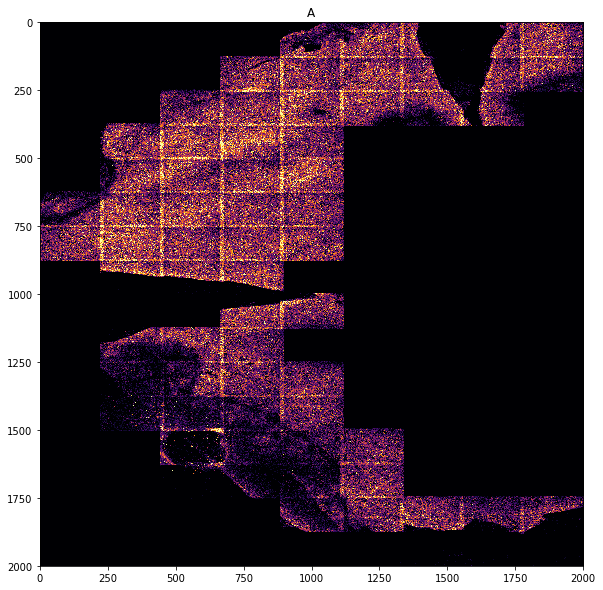

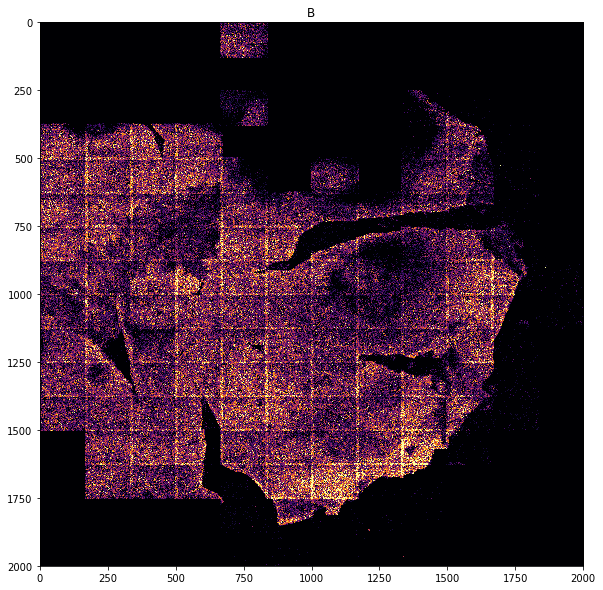

In [124]:

hist2d = np.histogram2d(temp_df[A_Mask].CoordY,temp_df[A_Mask].CoordX,bins=2000)
Display(hist2d[0],title='A')
plt.show()
hist2d = np.histogram2d(temp_df[B_Mask].CoordY,temp_df[B_Mask].CoordX,bins=2000)
Display(hist2d[0],title='B')
plt.show()

/home/zach/PythonRepos/PySpots/fish_helpers.py:74: RuntimeWarning: divide by zero encountered in log10
  plt.scatter(np.log10(fpkms),np.log10(counts),c=color,alpha=alpha,label=label)


SpearmanrResult(correlation=0.48311791479852717, pvalue=2.1940538532464643e-11)
SpearmanrResult(correlation=0.25003269977782155, pvalue=0.0009731846629439848)


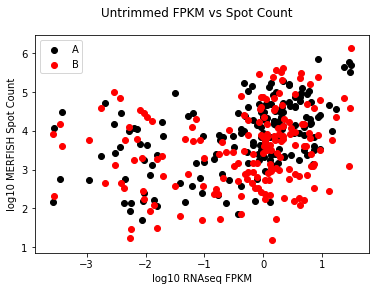

In [126]:
merfish_correlation(temp_df[A_Mask],color='k',label='A')
merfish_correlation(temp_df[B_Mask],color='r',label='B')
plt.legend()
plt.show()

In [127]:
tforms = pickle.load(open('/hybedata/Images/Zach/ExVivo/2Hr_2019Jun02/results/tforms.pkl','rb'))

In [137]:
A_resid = []
B_resid = []
A_beads = []
B_beads = []
for pos in A:
    temp = tforms['good'][pos]
    for hybe in temp.keys():
        A_resid.append(temp[hybe][1])
        A_beads.append(temp[hybe][2])
for pos in B:
    temp = tforms['good'][pos]
    for hybe in temp.keys():
        B_resid.append(temp[hybe][1])
        B_beads.append(temp[hybe][2])

In [138]:
print(np.median(A_resid))
print(np.median(B_resid))
print(np.median(A_beads))
print(np.median(B_beads))

0.3768626334514855
0.4098985524363138
210.0
273.0


In [143]:
md2 = Metadata('/hybedata/Images/Zach/ExVivo/2Hr_2019Jun02/hybe6_19/')
yes = 0
no = 0
for pos in md2.image_table.Position.unique():
    if pos in A:
        yes += 1
    else:
        no +=1
print('Yes: ',yes)
print('No: ',no)

Yes:  0
No:  355


In [148]:
Positions = md2.image_table.Position.unique()
Yes = 0
No = 0
for pos in spotcalls_2Hr_Wounded.posname.unique():
    if pos in Positions:
        Yes += 1
    else:
        No += 1
print('Yes: ',Yes)
print('No: ',No)

Yes:  209
No:  43


In [152]:
rehybe_spotcalls_2Hr_wounded = []
standard_spotcalls_2Hr_wounded = []
for pos in spotcalls_2Hr_Wounded.posname.unique():
    if pos in Positions:
        rehybe_spotcalls_2Hr_wounded.append(spotcalls_2Hr_Wounded[spotcalls_2Hr_Wounded.posname==pos])
    else:
        standard_spotcalls_2Hr_wounded.append(spotcalls_2Hr_Wounded[spotcalls_2Hr_Wounded.posname==pos])
standard_spotcalls_2Hr_wounded = pd.concat(standard_spotcalls_2Hr_wounded,ignore_index=True)
rehybe_spotcalls_2Hr_wounded = pd.concat(rehybe_spotcalls_2Hr_wounded,ignore_index=True)

/home/zach/PythonRepos/PySpots/fish_helpers.py:74: RuntimeWarning: divide by zero encountered in log10
  plt.scatter(np.log10(fpkms),np.log10(counts),c=color,alpha=alpha,label=label)


SpearmanrResult(correlation=0.24898735749359938, pvalue=0.0010237207868061514)
SpearmanrResult(correlation=0.5091487268101855, pvalue=1.1525386615832435e-12)


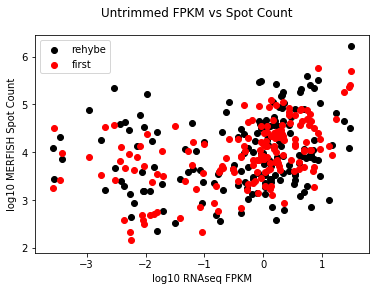

In [156]:
merfish_correlation(rehybe_spotcalls_2Hr_wounded,color='k',label='rehybe')
merfish_correlation(standard_spotcalls_2Hr_wounded,color='r',label='first')
plt.legend()
plt.show()

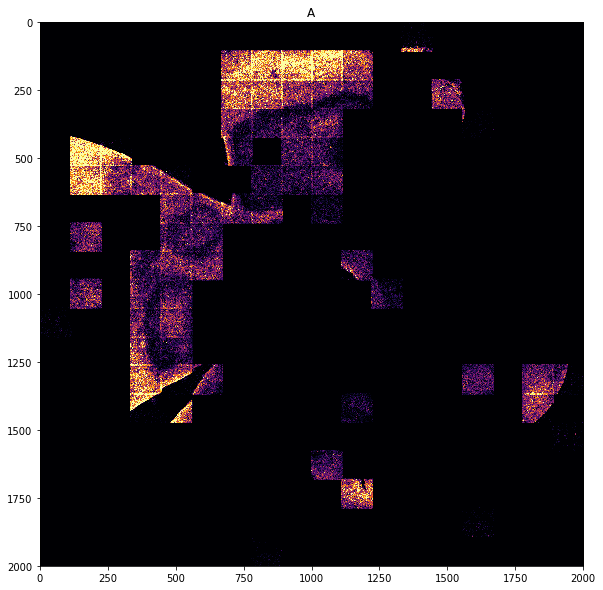

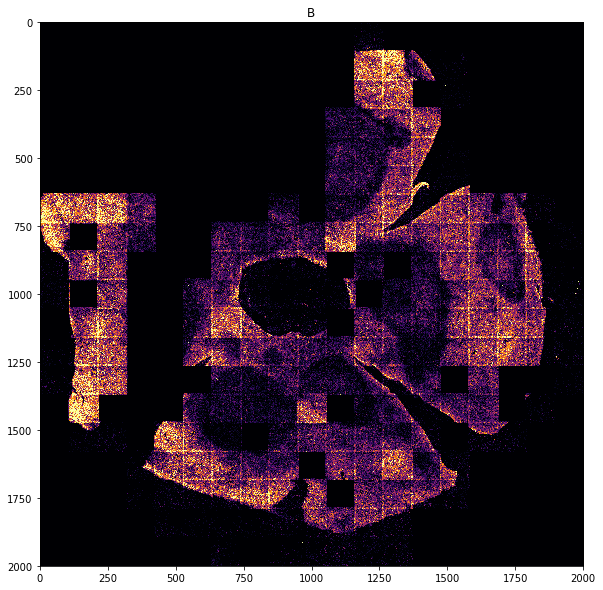

In [157]:

hist2d = np.histogram2d(standard_spotcalls_2Hr_wounded.CoordY,standard_spotcalls_2Hr_wounded.CoordX,bins=2000)
Display(hist2d[0],title='A')
plt.show()
hist2d = np.histogram2d(rehybe_spotcalls_2Hr_wounded.CoordY,rehybe_spotcalls_2Hr_wounded.CoordX,bins=2000)
Display(hist2d[0],title='B')
plt.show()

In [174]:
hdata = HybeData('/hybedata/Images/Zach/ExVivo/2Hr_2019Jun02/codestacks/Pos1/')

In [175]:
cstk = hdata.load_data('Pos1',5,'cstk')

In [186]:
import time
completed_idx = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]
then = time.time()
completed_not_processed_idx = np.array([i for i in completed_idx if np.mean(cstk[:,:,i])==0])
print(time.time()-then)

0.057744503021240234


In [7]:
spotcalls_list = []
for key in spotcalls_dict.keys():
    temp = spotcalls_dict[key]
    temp['sample'] = key
    spotcalls_list.append(temp)

In [8]:
spotcalls = pd.concat(spotcalls_list,axis=0,ignore_index=True)
spotcalls

,gene,ssum,centroid,ave,npixels,cword_idx,z,posname,CoordX,CoordY,distance,sample
0,Cab39l,32867.0,"(1.0, 66.0)",1643.350000,5,22,3,Pos132,108.962000,2469.109000,1244.177527,2Hr_Wounded
1,Myh9,23181.0,"(0.0, 75.0)",1931.750000,3,90,3,Pos132,109.943000,2469.000000,1243.921208,2Hr_Wounded
2,Itga6,22652.0,"(0.3333333333333333, 716.6666666666666)",1887.666667,3,75,3,Pos132,179.884667,2469.036333,1220.140793,2Hr_Wounded
3,Gja1,20610.0,"(0.0, 880.5)",2576.250000,2,59,3,Pos132,197.742500,2469.000000,1214.683506,2Hr_Wounded
4,Myh9,25011.0,"(0.0, 1265.0)",2084.250000,3,90,3,Pos132,239.653000,2469.000000,1202.738088,2Hr_Wounded
5,Ccnd1,30530.0,"(0.4, 1422.2)",1526.500000,5,28,3,Pos132,256.787800,2469.043600,1198.200081,2Hr_Wounded
6,Myh9,8381.0,"(0.0, 1433.0)",2095.250000,1,90,3,Pos132,257.965000,2469.000000,1197.941734,2Hr_Wounded
7,Myh9,14924.0,"(0.0, 1456.0)",3731.000000,1,90,3,Pos132,260.472000,2469.000000,1197.305391,2Hr_Wounded
8,Ccnd1,6387.0,"(0.0, 1734.0)",1596.750000,1,28,3,Pos132,290.774000,2469.000000,1190.004814,2Hr_Wounded
9,Tnfrsf11a,6167.0,"(1.0, 727.0)",1541.750000,1,164,3,Pos132,181.011000,2469.109000,1219.718402,2Hr_Wounded


In [10]:
counts = Counter(spotcalls.gene)

In [12]:
gns = []
ccs = []
for gn,cc in counts.items():
    gns.append(gn)
    ccs.append(cc)

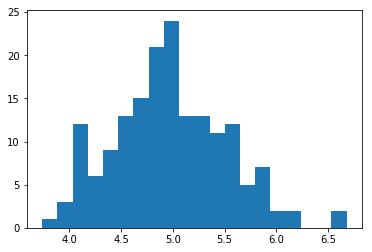

In [16]:
plt.hist(np.log10(ccs),bins=20)
plt.show()